# Task-5 Image Compression using Matrix Factorisation

You have an image patch of size (50x50) that you want to compress using matrix factorization. To do this, you'll split the patch [N×N] into two smaller matrices of size [N×r] and [r×N] using matrix factorization. Compute the compressed patch by multiplying these two matrices and compare the reconstructed image patch with the original patch. Compute the Root Mean Squared Error (RMSE) and Peak Signal-to-Noise Ratio (PSNR) between the original and reconstructed image patches.

- Test different values for the low-rank r=[5,10,25,50].
- Use Gradient Descent to learn the compressed matrices.
- Display the reconstructed image patches, keeping the original pixel values outside the patch unchanged, and use your compressed matrix for the patch to show how well the reconstruction works.
- Compute the RMSE and PSNR for each value of r.

Here is a reference set of patches that you can choose. You can chose an image of your liking and create patches. You can choose the image shown below as well.

### Importing Required Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn import preprocessing
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [3]:
# Setting the seed for Python, NumPy, and PyTorch (both CPU and GPU)
def set_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)  # if using CUDA
    torch.cuda.manual_seed_all(seed)  # for multi-GPU
    torch.backends.cudnn.deterministic = True  # Ensures deterministic behavior
    torch.backends.cudnn.benchmark = False     # Disables the auto-tuner that finds the best algorithm

# Call this function before using any random number generators
set_seed(42)

### Loading the image

torch.Size([3, 1365, 2048])


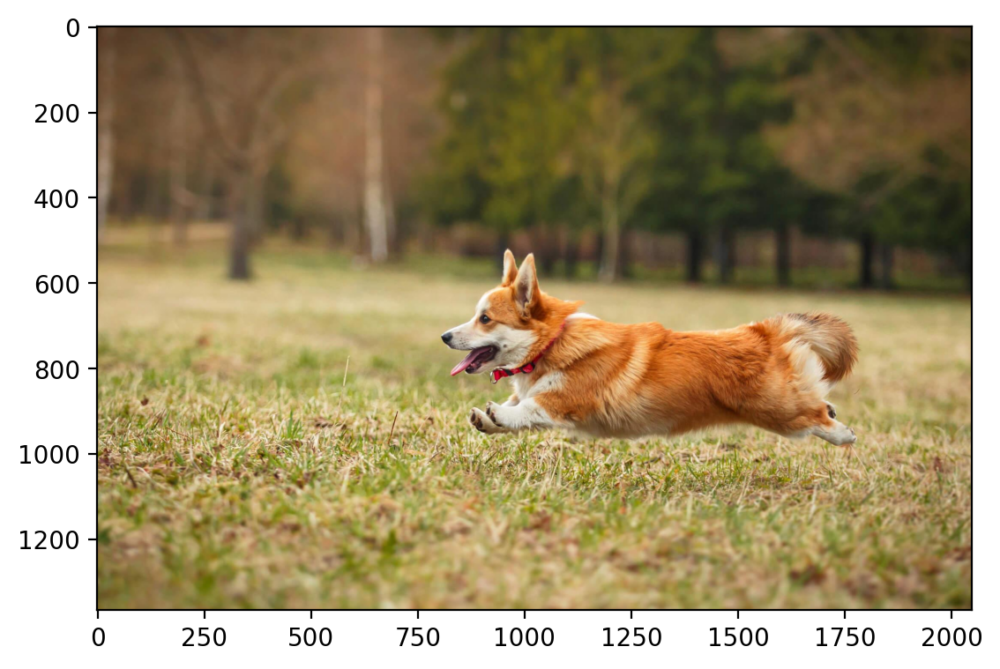

In [4]:
import os
from PIL import Image
import requests

url = 'https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg'
img_name = 'dog.jpg'

if not os.path.exists(img_name):
    img = Image.open(requests.get(url, stream=True).raw)
    img.save(img_name)

img = torchvision.io.read_image(img_name)
print(img.shape)
plt.imshow(img.permute(1, 2, 0))

### Scaling the image

In [5]:
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

torch.Size([3, 1365, 2048])


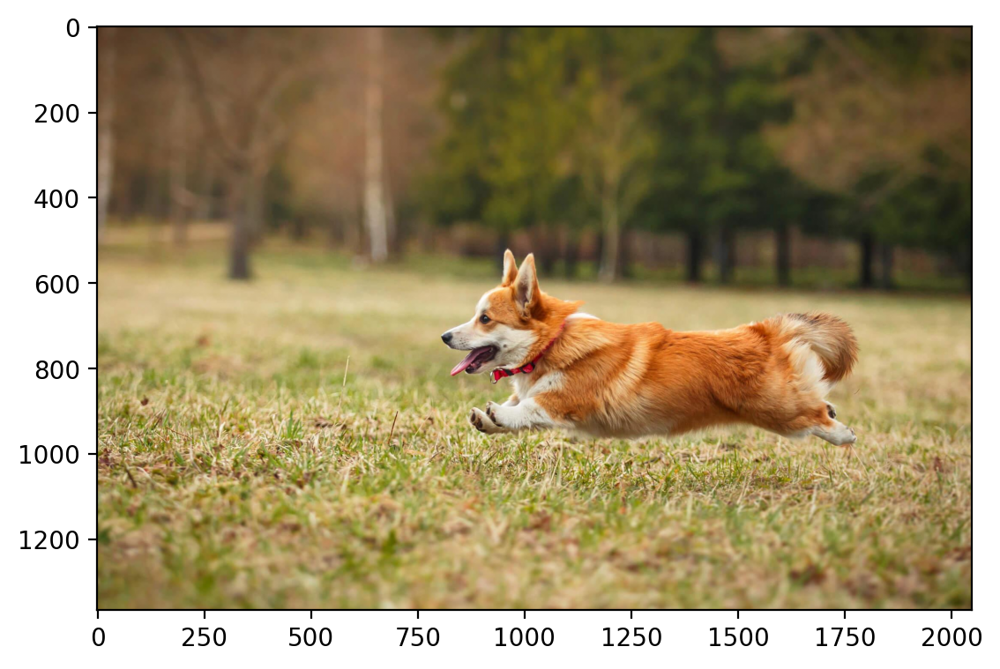

In [6]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled = torch.tensor(img_scaled)
print(img_scaled.shape)
plt.imshow(img_scaled.permute(1, 2, 0))

### Croppping the image

torch.Size([3, 300, 300])


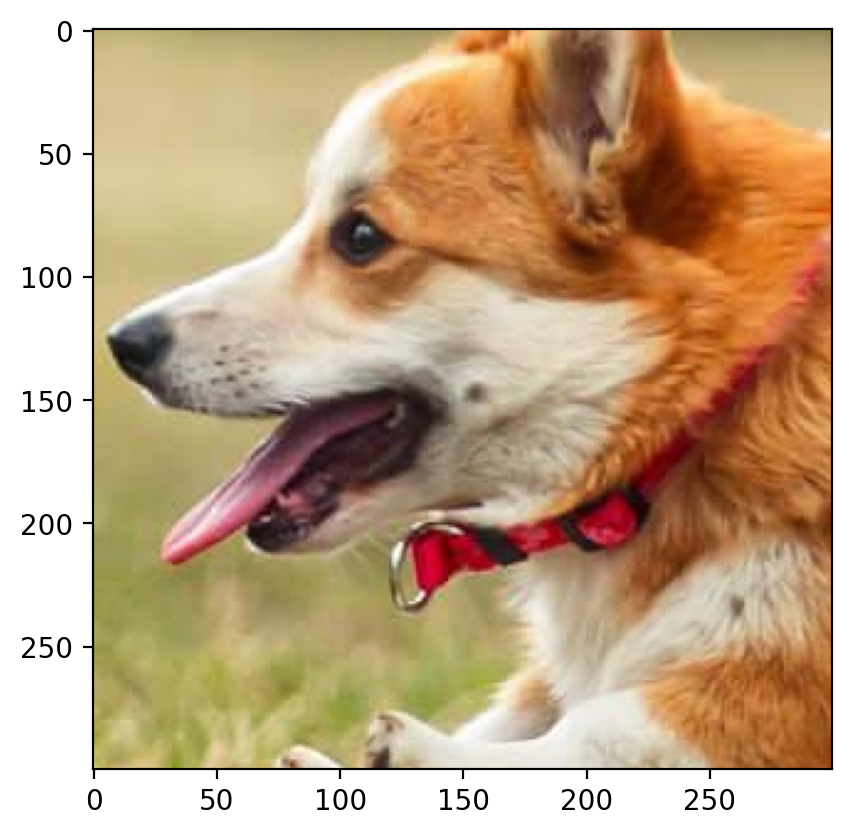

In [7]:
crop = torchvision.transforms.functional.crop(img_scaled, 600, 800, 300, 300)

print(crop.shape)
plt.imshow(crop.permute(1, 2, 0))

### Extract a 50x50 patch from the image

Shape of the patch: torch.Size([3, 50, 50])


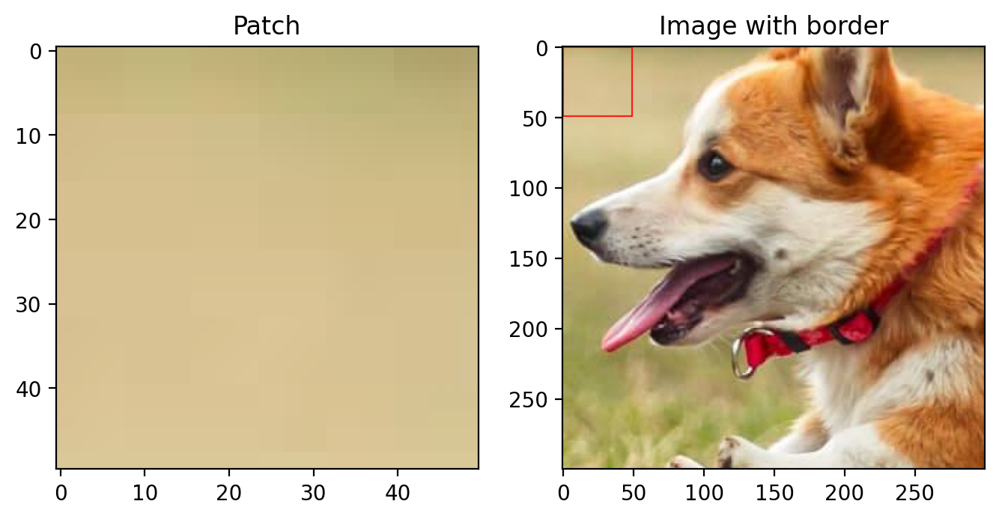

In [8]:
def extract_patch(crop, patch_size=50, top_left_x=0, top_left_y=0, border_color=torch.tensor([1.0, 0.0, 0.0]), border_thickness=1):
    channels, height, width = crop.shape

    if patch_size > height or patch_size > width:
        raise ValueError("Patch size must be smaller than the dimensions of the image.")

    patch = crop[:, top_left_x:top_left_x + patch_size, top_left_y:top_left_y + patch_size]

    img_with_border = crop.clone()
    img_with_border[:, top_left_x:top_left_x + border_thickness, top_left_y:top_left_y + patch_size] = border_color[:, None, None]
    img_with_border[:, top_left_x + patch_size - border_thickness:top_left_x + patch_size, top_left_y:top_left_y + patch_size] = border_color[:, None, None]
    img_with_border[:, top_left_x:top_left_x + patch_size, top_left_y:top_left_y + border_thickness] = border_color[:, None, None]
    img_with_border[:, top_left_x:top_left_x + patch_size, top_left_y + patch_size - border_thickness:top_left_y + patch_size] = border_color[:, None, None]

    print("Shape of the patch:", patch.shape)
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(rearrange(patch, 'c h w -> h w c').cpu().numpy())
    plt.title("Patch")
    plt.subplot(1, 2, 2)
    plt.imshow(rearrange(img_with_border, 'c h w -> h w c').cpu().numpy())
    plt.title("Image with border")
    plt.show()

    return patch, img_with_border

# Example usage
patch, img_with_border = extract_patch(crop)


### Defined Functions

In [9]:
def matrix_factorization(image_tensor, rank, learning_rate=0.01, num_epochs=5000, tol=1e-6, device=torch.device("cpu")):
    """
    Perform matrix factorization on an image tensor using gradient descent.
    Args:
        image_tensor (torch.Tensor): The input image tensor of shape (n_channels, height, width).
        rank (int): The rank for the factorization.
        learning_rate (float, optional): The learning rate for the optimizer. Default is 0.01.
        num_epochs (int, optional): The number of epochs for training. Default is 5000.
        tol (float, optional): The tolerance for convergence. Default is 1e-6.
        device (torch.device, optional): The device to perform computations on. Default is CPU.
    Returns:
        tuple: A tuple containing:
            - W (torch.nn.Parameter): The learned factor matrix W of shape (n_channels, rank).
            - H (torch.nn.Parameter): The learned factor matrix H of shape (rank, n_pixels).
            - loss_list (list): A list of loss values for each epoch.
    """

    height, width = image_tensor.shape
    # Initialize the factors randomly
    W = torch.randn(height, rank, requires_grad=True, device=device)
    H = torch.randn(rank, width, requires_grad=True, device=device)

    optimizer = optim.Adam([W, H], lr=learning_rate)
    loss_list = []

    for epoch in range(1, num_epochs+1):
        optimizer.zero_grad()

        # Compute the reconstructed image
        reconstructed_img = torch.matmul(W, H)

        # Compute the loss
        loss = F.mse_loss(reconstructed_img, image_tensor)
        loss_list.append(loss.item())

        # Backward pass
        loss.backward()
        optimizer.step()

        if epoch % 1000 == 0:
            print(f"Epoch {epoch}/{num_epochs} - Loss: {loss.item():.6f}")

        if loss.item() < tol:
            print(f"Converged at epoch {epoch} with loss: {loss.item()}")
            break

    return W, H, loss, loss_list

In [10]:
def compress_color_image(image_tensor, rank, learning_rate=0.01, num_epochs=5000, tol=1e-6, device=torch.device("cpu")):
    # channels, height, width = image_tensor.shape
    # compressed_img = torch.zeros(channels, height, width, device=device)

    image_tensor = image_tensor.to(device)
    R_channel = image_tensor[0].to(device).float()
    G_channel = image_tensor[1].to(device).float()
    B_channel = image_tensor[2].to(device).float()

    print("Factorizing the R channel...")
    W_R, H_R, loss_R, _ = matrix_factorization(R_channel, rank, learning_rate, num_epochs, tol, device)
    print("Factorizing the G channel...")
    W_G, H_G, loss_G, _ = matrix_factorization(G_channel, rank, learning_rate, num_epochs, tol, device)
    print("Factorizing the B channel...")
    W_B, H_B, loss_B, _ = matrix_factorization(B_channel, rank, learning_rate, num_epochs, tol, device)

    compressed_img = torch.stack([torch.matmul(W_R, H_R), torch.matmul(W_G, H_G), torch.matmul(W_B, H_B)], dim=0)

    return compressed_img, (loss_R, loss_G, loss_B)

In [24]:
# Helper function for RMSE and PSNR calculation
def compute_rmse_psnr(original, reconstructed):
    original = original.to(reconstructed.device)
    mse = torch.mean((original - reconstructed) ** 2)
    rmse = torch.sqrt(mse)
    psnr = 20 * torch.log10(1.0 / rmse)
    return rmse.item(), psnr.item()

# Helper function to display the original and reconstructed patches
def display_patches(original, reconstructed, rank):
    fig, axs = plt.subplots(1, 2, figsize=(8, 8))
    axs[0].imshow(rearrange(original, 'c h w -> h w c').cpu().numpy())
    axs[0].set_title(f'Original Patch (rank={rank})')
    axs[1].imshow(rearrange(reconstructed, 'c h w -> h w c').cpu().detach().numpy())
    axs[1].set_title(f'Reconstructed Patch (rank={rank})')
    plt.show()

# Helper function to plot rmse and psnr values
def plot_rmse_psnr(ranks, rmse_values, psnr_values, patch_id):
    # Create subplots for RMSE and PSNR values
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Plot RMSE values
    axs[0].plot(ranks, rmse_values, marker='o', label='RMSE')
    axs[0].set_xlabel('Rank')
    axs[0].set_ylabel('RMSE')
    axs[0].set_title(f'RMSE values for Patch {patch_id}')
    axs[0].legend()
    axs[0].grid()

    # Plot PSNR values
    axs[1].plot(ranks, psnr_values, marker='o', label='PSNR')
    axs[1].set_xlabel('Rank')
    axs[1].set_ylabel('PSNR')
    axs[1].set_title(f'PSNR values for Patch {patch_id}')
    axs[1].legend()
    axs[1].grid()

    plt.tight_layout()
    plt.show()

In [12]:
def compress_compare_evaluate(image_tensor, rank, learning_rate=0.01, num_epochs=5000, tol=1e-6, device=torch.device("cpu")):
    compressed_img, color_loss = compress_color_image(image_tensor, rank, learning_rate, num_epochs, tol, device)

    rmse, psnr = compute_rmse_psnr(image_tensor, compressed_img)
    print(f"\nRMSE: {rmse:.6f}")
    print(f"PSNR: {psnr:.6f}")

    display_patches(image_tensor, compressed_img, rank)

    return compressed_img, color_loss, rmse, psnr

def add_patch_to_image(image_tensor, patch, top_left_x, top_left_y):
    channels, height, width = image_tensor.shape
    patch_size = patch.shape[1]

    if top_left_x + patch_size > height or top_left_y + patch_size > width:
        raise ValueError("Patch does not fit within the image dimensions.")

    image_with_patch = image_tensor.clone()
    image_with_patch[:, top_left_x:top_left_x + patch_size, top_left_y:top_left_y + patch_size] = patch

    fig, axs = plt.subplots(1, 2, figsize=(8, 8))
    axs[0].imshow(rearrange(image_tensor, 'c h w -> h w c').cpu().detach().numpy())
    axs[0].set_title("Original Image")
    axs[1].imshow(rearrange(image_with_patch, 'c h w -> h w c').cpu().detach().numpy())
    axs[1].set_title("Image with Patch")
    plt.show()

    return image_with_patch

## Patch-1

Shape of the patch: torch.Size([3, 50, 50])


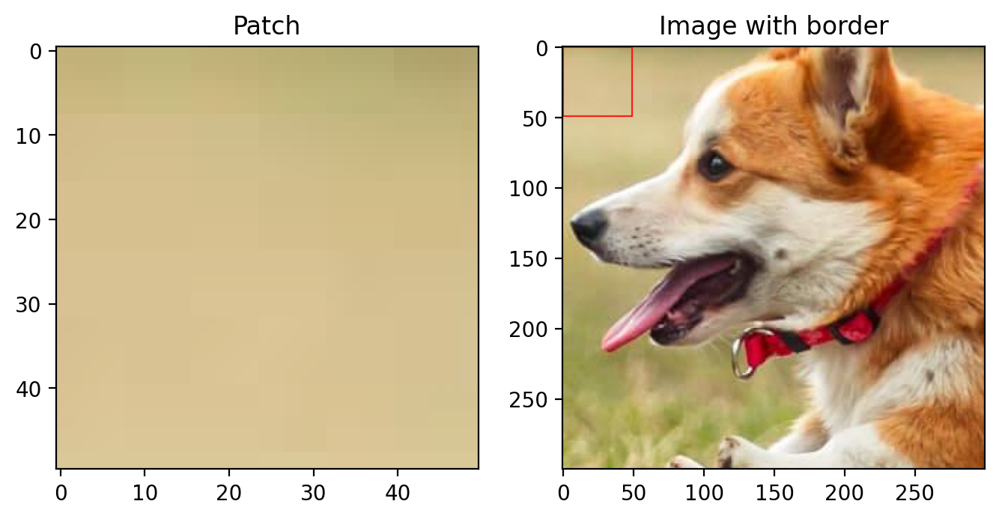

****************************************************************************************************
Patch 1:
Top left coordinates: (0, 0)
Patch size: 50


Rank: 5
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.000163
Epoch 2000/5000 - Loss: 0.000088
Epoch 3000/5000 - Loss: 0.000075
Epoch 4000/5000 - Loss: 0.000017
Epoch 5000/5000 - Loss: 0.000015
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.000050
Epoch 2000/5000 - Loss: 0.000050
Epoch 3000/5000 - Loss: 0.000049
Epoch 4000/5000 - Loss: 0.000049
Epoch 5000/5000 - Loss: 0.000048
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.000063
Epoch 2000/5000 - Loss: 0.000063
Epoch 3000/5000 - Loss: 0.000063
Epoch 4000/5000 - Loss: 0.000063
Epoch 5000/5000 - Loss: 0.000062

RMSE: 0.006451
PSNR: 43.807847


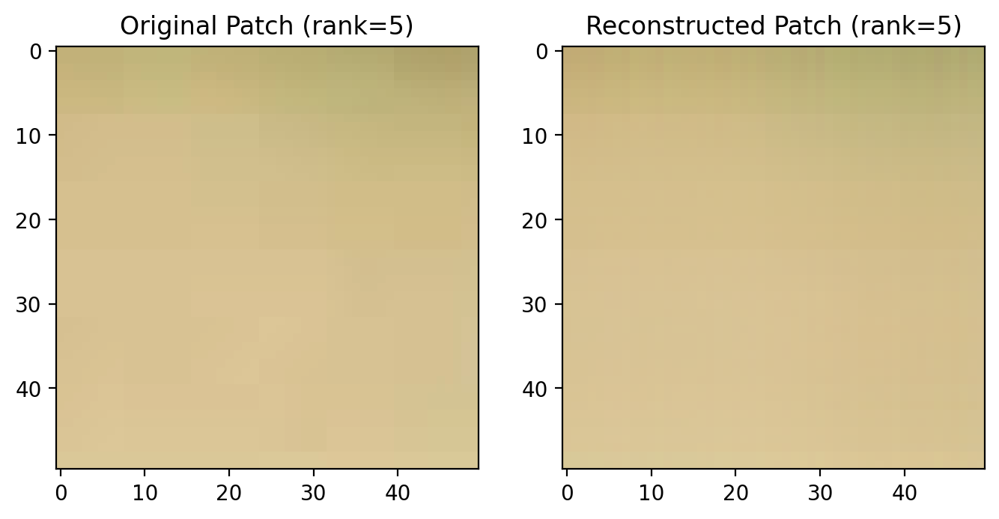

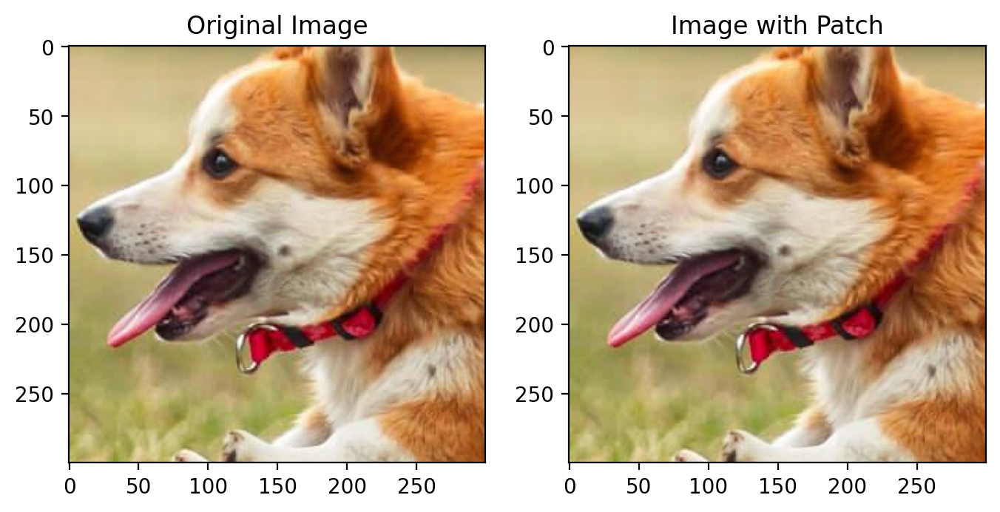



Rank: 10
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.000072
Epoch 2000/5000 - Loss: 0.000071
Epoch 3000/5000 - Loss: 0.000069
Epoch 4000/5000 - Loss: 0.000065
Epoch 5000/5000 - Loss: 0.000056
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.000044
Epoch 2000/5000 - Loss: 0.000044
Epoch 3000/5000 - Loss: 0.000043
Epoch 4000/5000 - Loss: 0.000042
Epoch 5000/5000 - Loss: 0.000041
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.000062
Epoch 2000/5000 - Loss: 0.000049
Epoch 3000/5000 - Loss: 0.000048
Epoch 4000/5000 - Loss: 0.000047
Epoch 5000/5000 - Loss: 0.000043

RMSE: 0.006834
PSNR: 43.307004


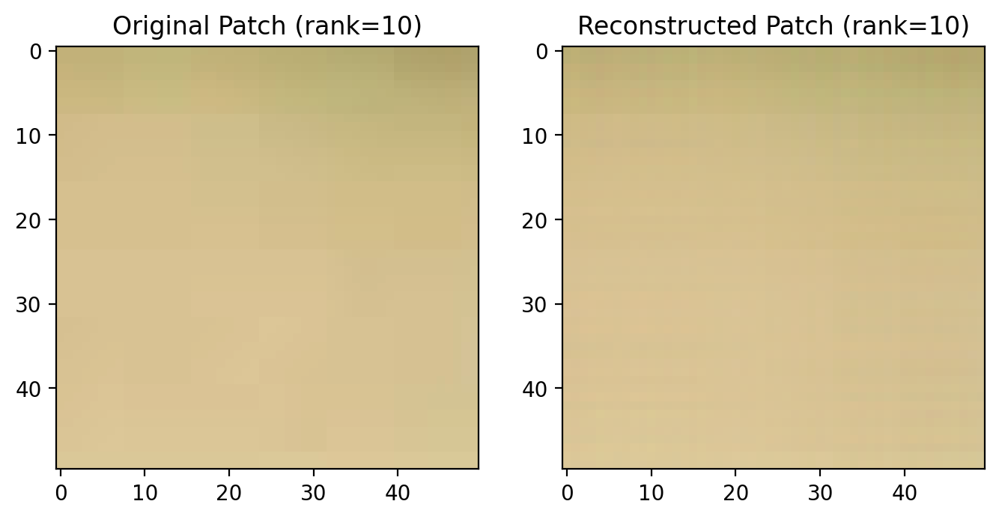

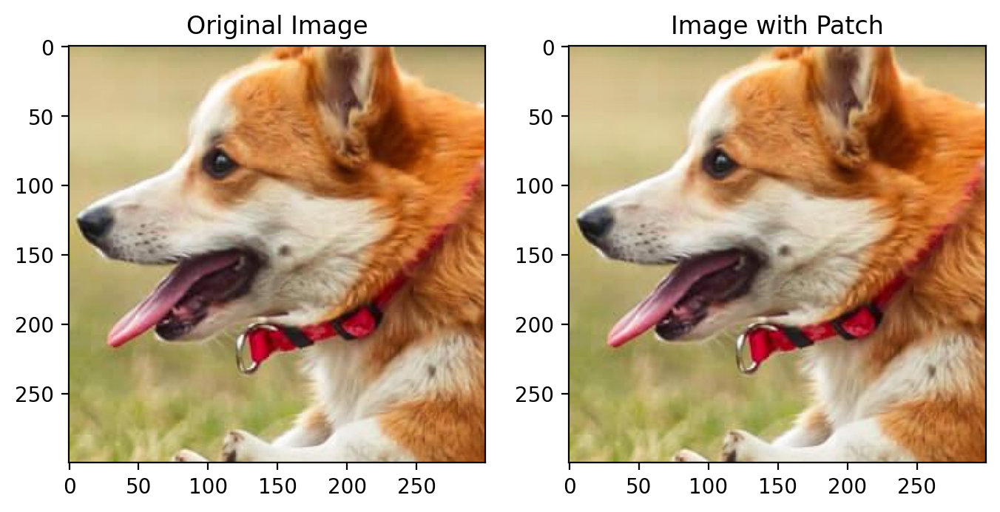



Rank: 25
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.000081
Epoch 2000/5000 - Loss: 0.000045
Epoch 3000/5000 - Loss: 0.000041
Epoch 4000/5000 - Loss: 0.000023
Epoch 5000/5000 - Loss: 0.000010
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.000042
Epoch 2000/5000 - Loss: 0.000027
Epoch 3000/5000 - Loss: 0.000027
Epoch 4000/5000 - Loss: 0.000026
Epoch 5000/5000 - Loss: 0.000023
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.000088
Epoch 2000/5000 - Loss: 0.000029
Epoch 3000/5000 - Loss: 0.000026
Epoch 4000/5000 - Loss: 0.000021
Epoch 5000/5000 - Loss: 0.000013

RMSE: 0.003929
PSNR: 48.114580


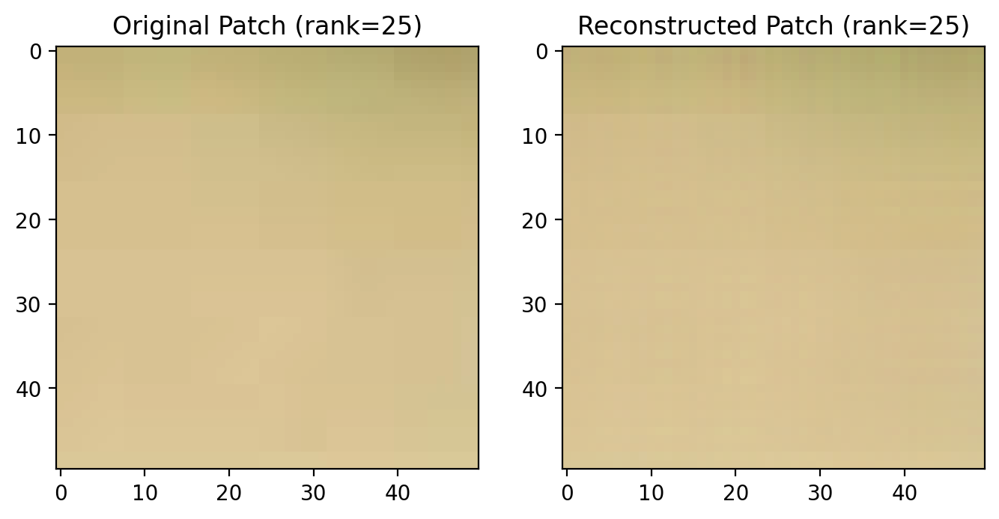

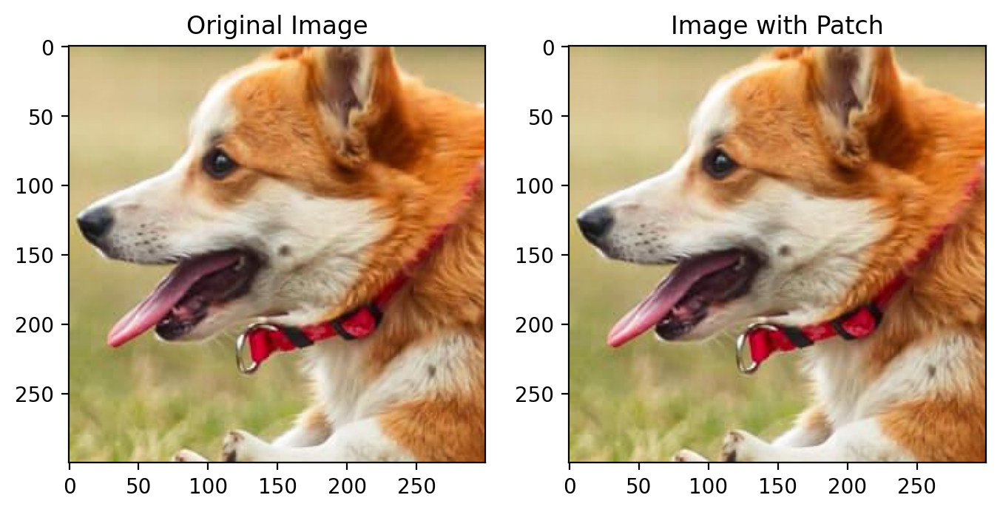



Rank: 50
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.000039
Epoch 2000/5000 - Loss: 0.000020
Epoch 3000/5000 - Loss: 0.000019
Epoch 4000/5000 - Loss: 0.000018
Epoch 5000/5000 - Loss: 0.000015
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.000035
Epoch 2000/5000 - Loss: 0.000014
Epoch 3000/5000 - Loss: 0.000014
Epoch 4000/5000 - Loss: 0.000012
Epoch 5000/5000 - Loss: 0.000009
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.000041
Epoch 2000/5000 - Loss: 0.000017
Epoch 3000/5000 - Loss: 0.000016
Epoch 4000/5000 - Loss: 0.000015
Epoch 5000/5000 - Loss: 0.000013

RMSE: 0.003483
PSNR: 49.161294


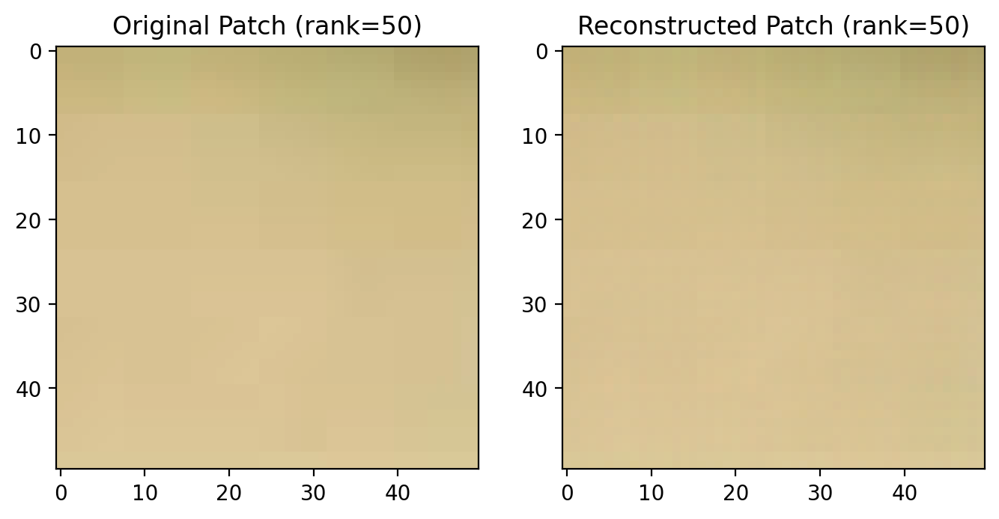

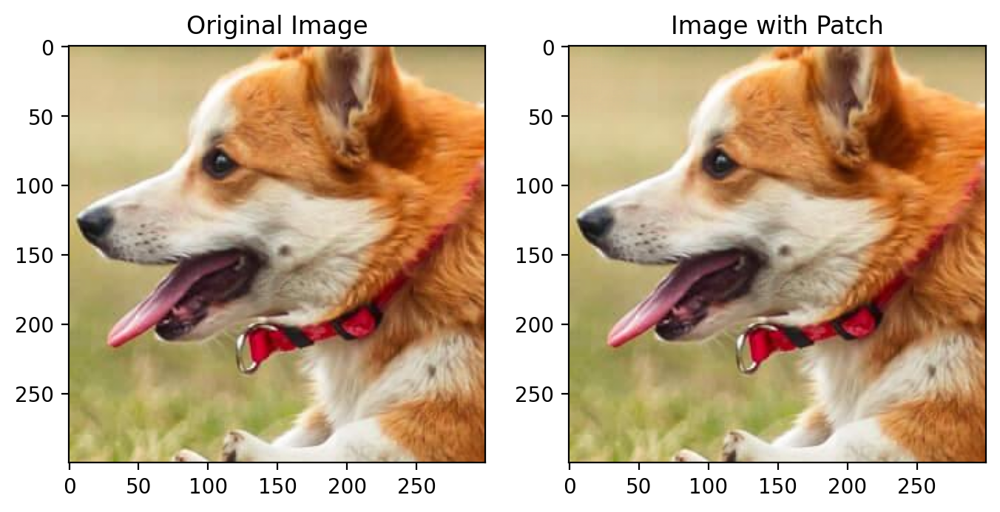

In [14]:
patch_size = 50
top_left_x = 0
top_left_y = 0

patch_1, bordered_img_1 = extract_patch(crop, patch_size, top_left_x, top_left_y)
print("*" * 100)
print("Patch 1:")
print(f"Top left coordinates: {top_left_x, top_left_y}")
print("Patch size:", patch_size)

ranks = [5, 10, 25, 50]
rmse_values_1 = []
psnr_values_1 = []
for rank in ranks:
    print(f"\n\nRank: {rank}")
    compressed_patch_1, color_loss_1, rmse_1, psnr_1 = compress_compare_evaluate(patch_1, rank, device=device)
    rmse_values_1.append(rmse_1)
    psnr_values_1.append(psnr_1)
    img_with_patch_1 = add_patch_to_image(crop, compressed_patch_1, top_left_x, top_left_y)

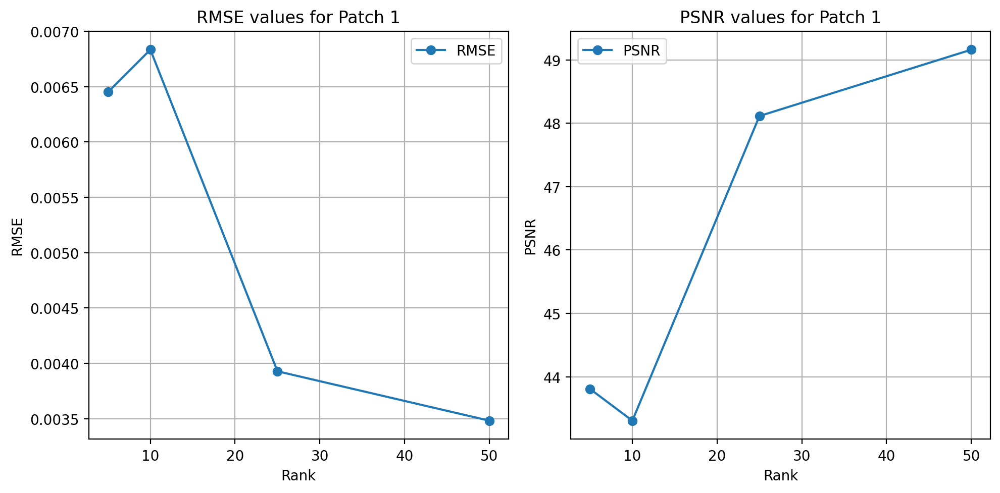

In [25]:
plot_rmse_psnr(ranks, rmse_values_1, psnr_values_1, patch_id=1)

## Patch-2

Shape of the patch: torch.Size([3, 50, 50])


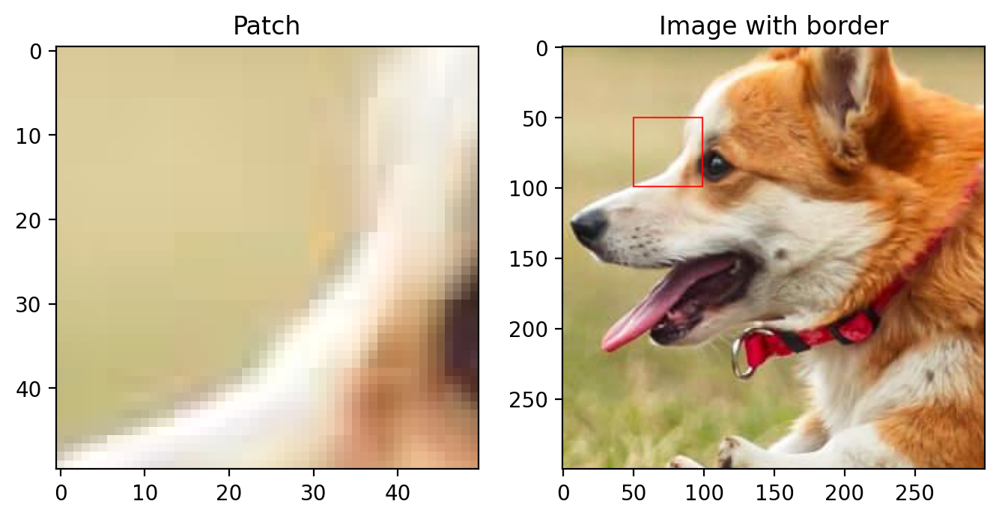

****************************************************************************************************
Patch 2:
Top left coordinates: (50, 50)
Patch size: 50


Rank: 5
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.006946
Epoch 2000/5000 - Loss: 0.003783
Epoch 3000/5000 - Loss: 0.001536
Epoch 4000/5000 - Loss: 0.001096
Epoch 5000/5000 - Loss: 0.000831
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.007988
Epoch 2000/5000 - Loss: 0.003145
Epoch 3000/5000 - Loss: 0.001594
Epoch 4000/5000 - Loss: 0.001088
Epoch 5000/5000 - Loss: 0.000887
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.008886
Epoch 2000/5000 - Loss: 0.003298
Epoch 3000/5000 - Loss: 0.001754
Epoch 4000/5000 - Loss: 0.001284


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5000/5000 - Loss: 0.001067

RMSE: 0.030466
PSNR: 30.323810


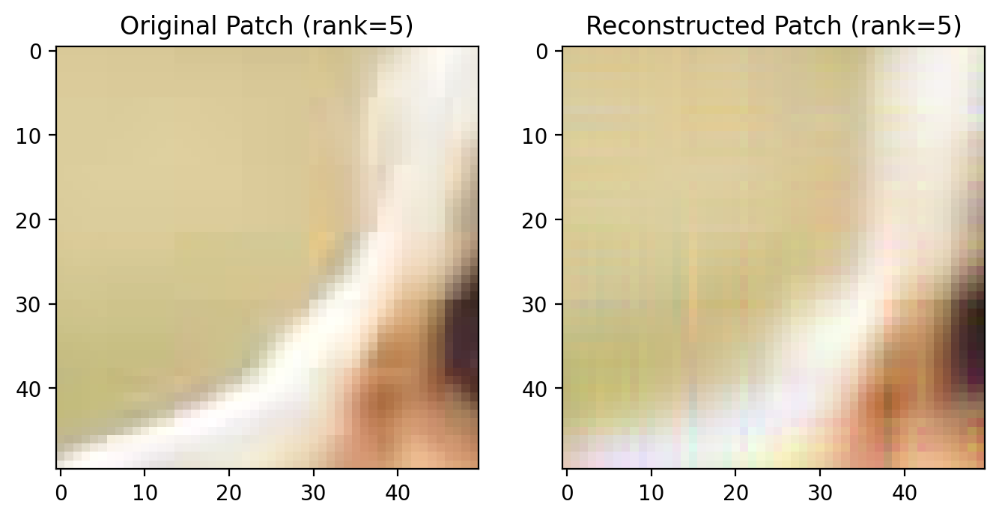

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


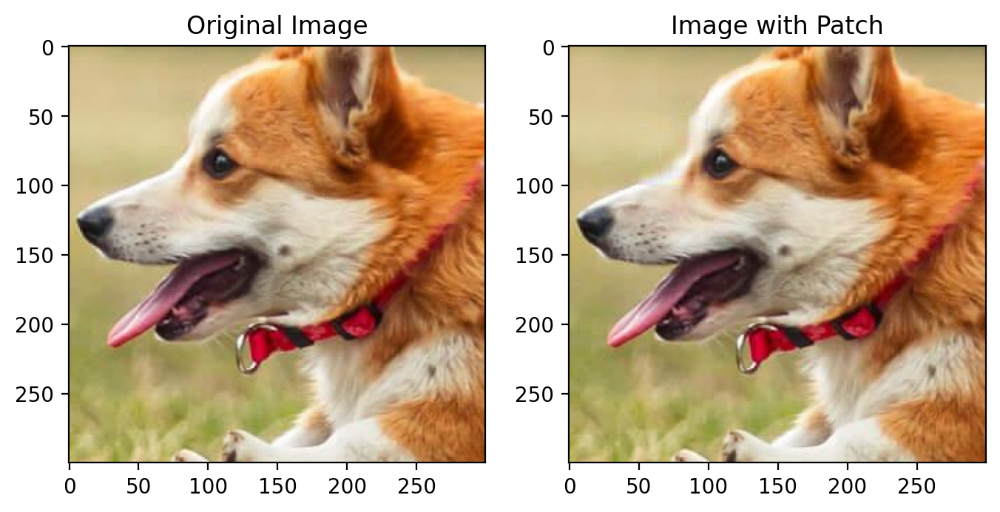



Rank: 10
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.003050
Epoch 2000/5000 - Loss: 0.001445
Epoch 3000/5000 - Loss: 0.000821
Epoch 4000/5000 - Loss: 0.000591
Epoch 5000/5000 - Loss: 0.000485
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.004635
Epoch 2000/5000 - Loss: 0.001690
Epoch 3000/5000 - Loss: 0.001123
Epoch 4000/5000 - Loss: 0.000994
Epoch 5000/5000 - Loss: 0.000874
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.006486
Epoch 2000/5000 - Loss: 0.003923
Epoch 3000/5000 - Loss: 0.001883
Epoch 4000/5000 - Loss: 0.000988


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5000/5000 - Loss: 0.000658

RMSE: 0.025922
PSNR: 31.726516


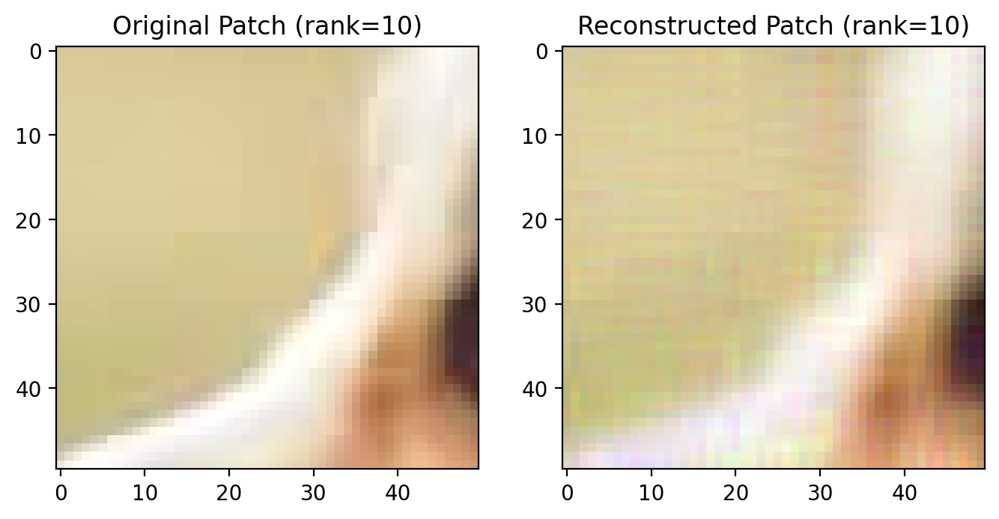

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


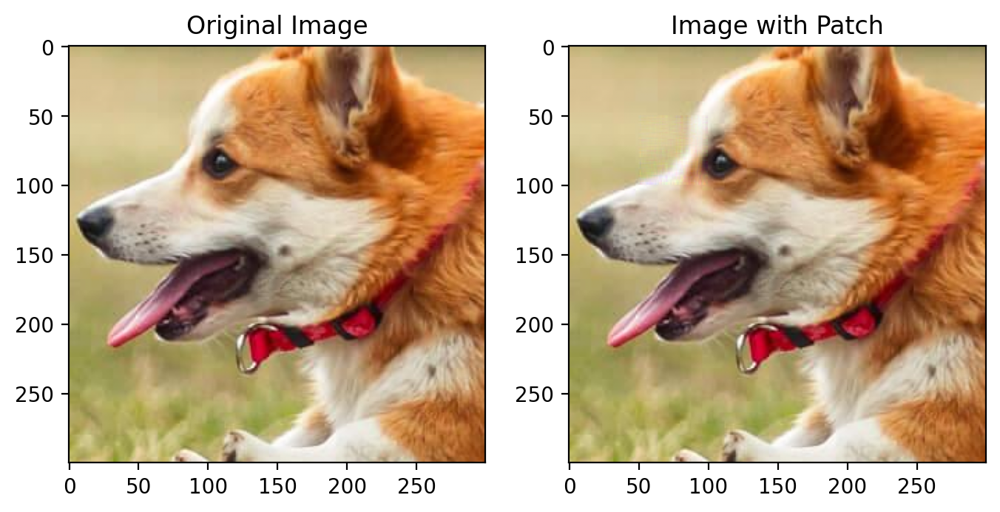



Rank: 25
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.000959
Epoch 2000/5000 - Loss: 0.000474
Epoch 3000/5000 - Loss: 0.000358
Epoch 4000/5000 - Loss: 0.000267
Epoch 5000/5000 - Loss: 0.000195
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.002008
Epoch 2000/5000 - Loss: 0.000744
Epoch 3000/5000 - Loss: 0.000522
Epoch 4000/5000 - Loss: 0.000363
Epoch 5000/5000 - Loss: 0.000270
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.002853
Epoch 2000/5000 - Loss: 0.001071
Epoch 3000/5000 - Loss: 0.000591
Epoch 4000/5000 - Loss: 0.000401


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5000/5000 - Loss: 0.000263

RMSE: 0.015575
PSNR: 36.151359


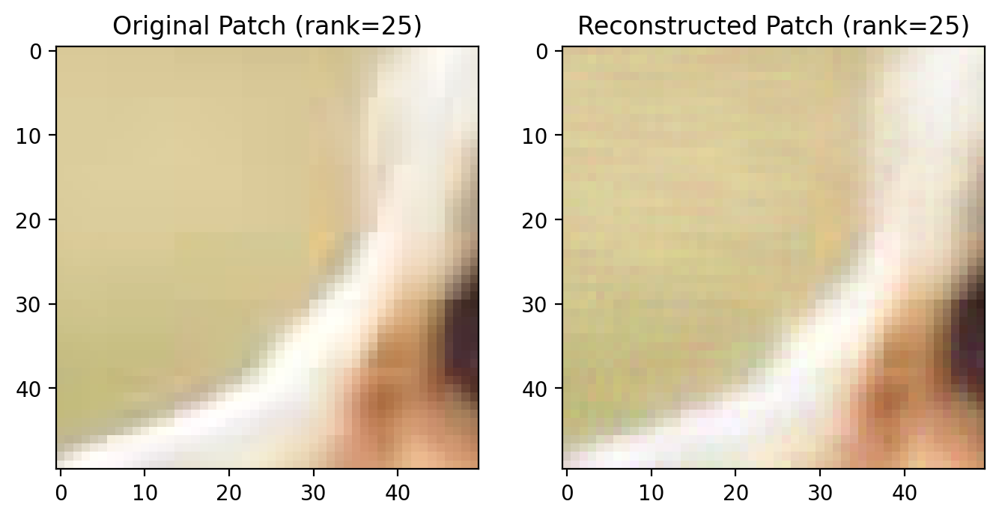

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


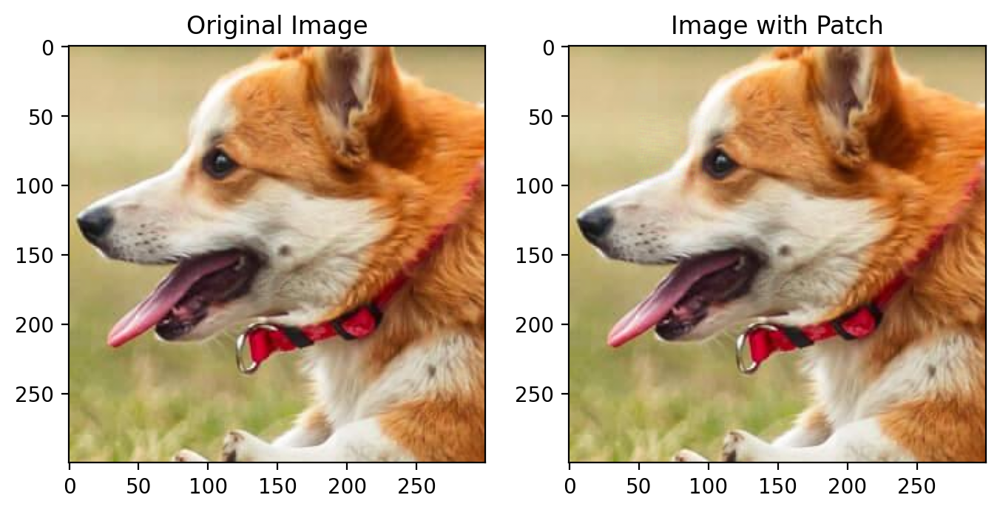



Rank: 50
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.000460
Epoch 2000/5000 - Loss: 0.000309
Epoch 3000/5000 - Loss: 0.000245
Epoch 4000/5000 - Loss: 0.000181
Epoch 5000/5000 - Loss: 0.000127
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.001014
Epoch 2000/5000 - Loss: 0.000308
Epoch 3000/5000 - Loss: 0.000200
Epoch 4000/5000 - Loss: 0.000124
Epoch 5000/5000 - Loss: 0.000074
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.000969
Epoch 2000/5000 - Loss: 0.000377
Epoch 3000/5000 - Loss: 0.000220
Epoch 4000/5000 - Loss: 0.000114


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5000/5000 - Loss: 0.000071

RMSE: 0.009523
PSNR: 40.424417


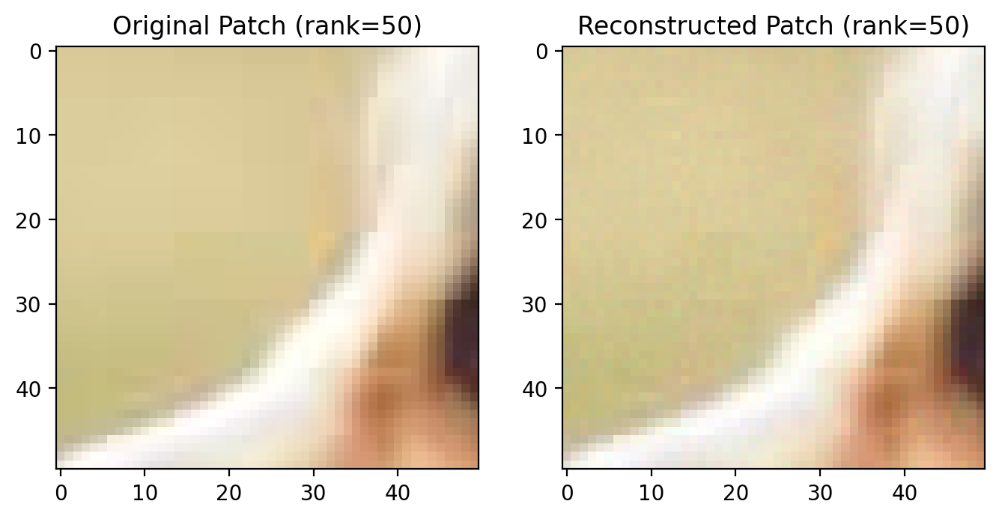

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


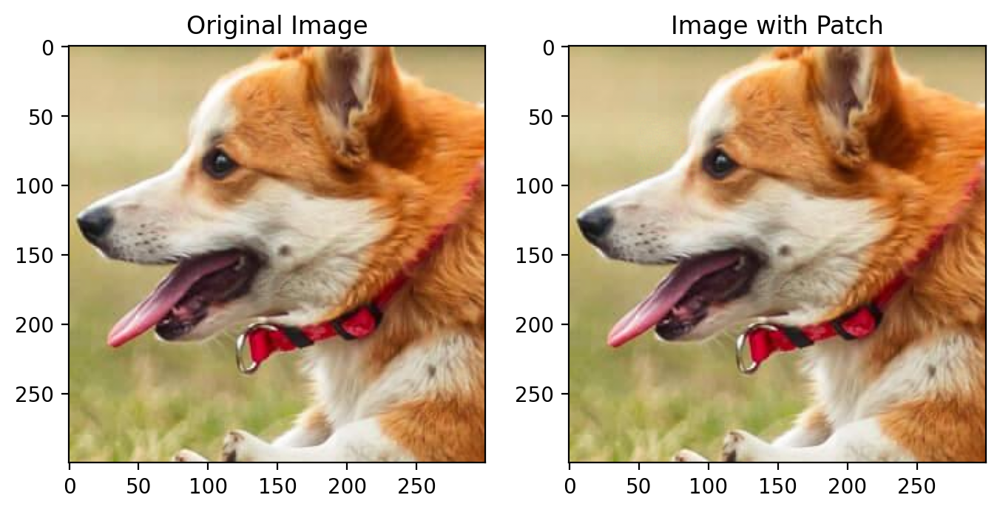

In [26]:
patch_size = 50
top_left_x = 50
top_left_y = 50

patch_2, bordered_img_2 = extract_patch(crop, patch_size, top_left_x, top_left_y)   
print("*" * 100)
print("Patch 2:")
print(f"Top left coordinates: {top_left_x, top_left_y}")
print("Patch size:", patch_size)

rmse_values_2 = []
psnr_values_2 = []

for rank in ranks:
    print(f"\n\nRank: {rank}")
    compressed_patch_2, color_loss_2, rmse_2, psnr_2 = compress_compare_evaluate(patch_2, rank, device=device)
    rmse_values_2.append(rmse_2)
    psnr_values_2.append(psnr_2)
    img_with_patch_2 = add_patch_to_image(crop, compressed_patch_2, top_left_x, top_left_y)


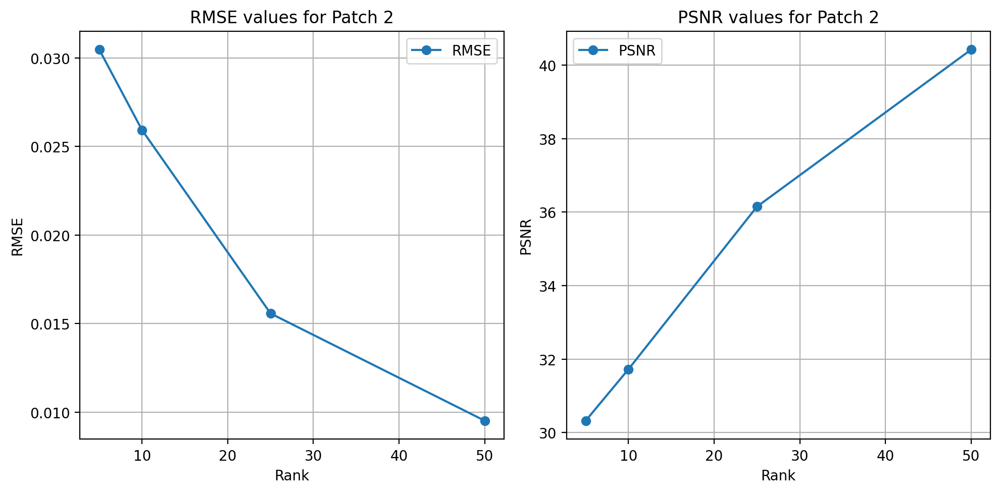

In [27]:
plot_rmse_psnr(ranks, rmse_values_2, psnr_values_2, patch_id=2)

## Patch-3

Shape of the patch: torch.Size([3, 50, 50])


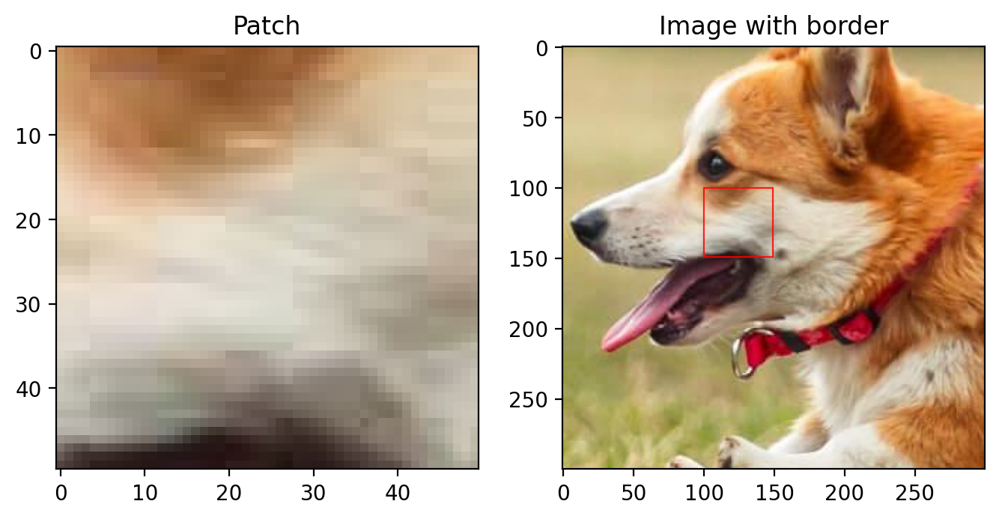

****************************************************************************************************
Patch 3:
Top left coordinates: (100, 100)
Patch size: 50


Rank: 5
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.005454
Epoch 2000/5000 - Loss: 0.002901
Epoch 3000/5000 - Loss: 0.001849
Epoch 4000/5000 - Loss: 0.001256
Epoch 5000/5000 - Loss: 0.000923
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.010523
Epoch 2000/5000 - Loss: 0.004015
Epoch 3000/5000 - Loss: 0.002312
Epoch 4000/5000 - Loss: 0.001459
Epoch 5000/5000 - Loss: 0.000988
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.005477
Epoch 2000/5000 - Loss: 0.002538
Epoch 3000/5000 - Loss: 0.001788
Epoch 4000/5000 - Loss: 0.001248
Epoch 5000/5000 - Loss: 0.000994

RMSE: 0.031112
PSNR: 30.141574


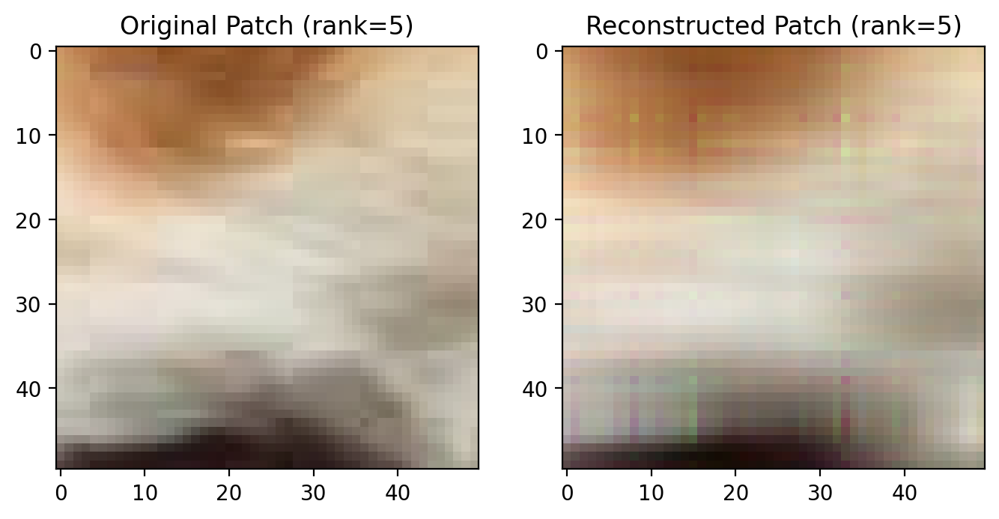

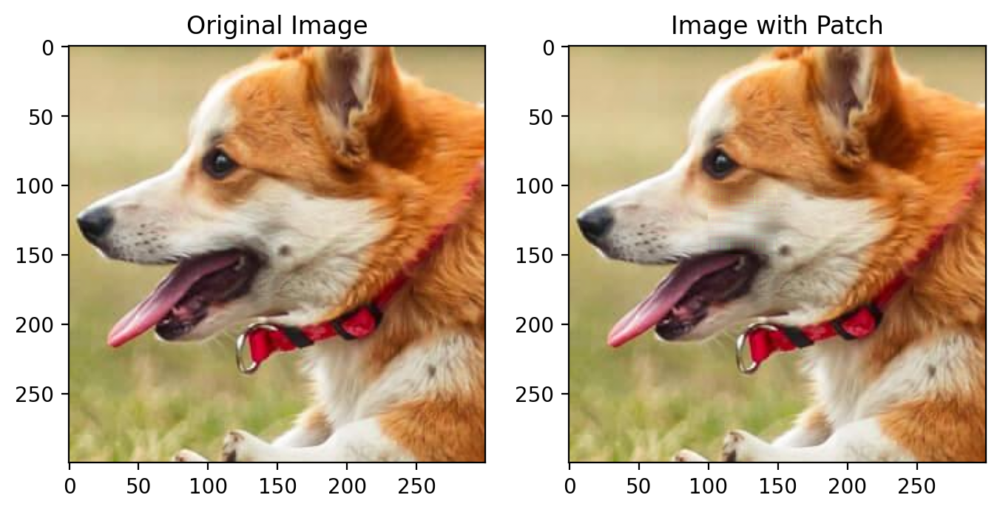



Rank: 10
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.001856
Epoch 2000/5000 - Loss: 0.001333
Epoch 3000/5000 - Loss: 0.000818
Epoch 4000/5000 - Loss: 0.000718
Epoch 5000/5000 - Loss: 0.000650
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.002259
Epoch 2000/5000 - Loss: 0.001667
Epoch 3000/5000 - Loss: 0.001106
Epoch 4000/5000 - Loss: 0.000725
Epoch 5000/5000 - Loss: 0.000509
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.005245
Epoch 2000/5000 - Loss: 0.002081
Epoch 3000/5000 - Loss: 0.001089
Epoch 4000/5000 - Loss: 0.000704
Epoch 5000/5000 - Loss: 0.000514

RMSE: 0.023612
PSNR: 32.537242


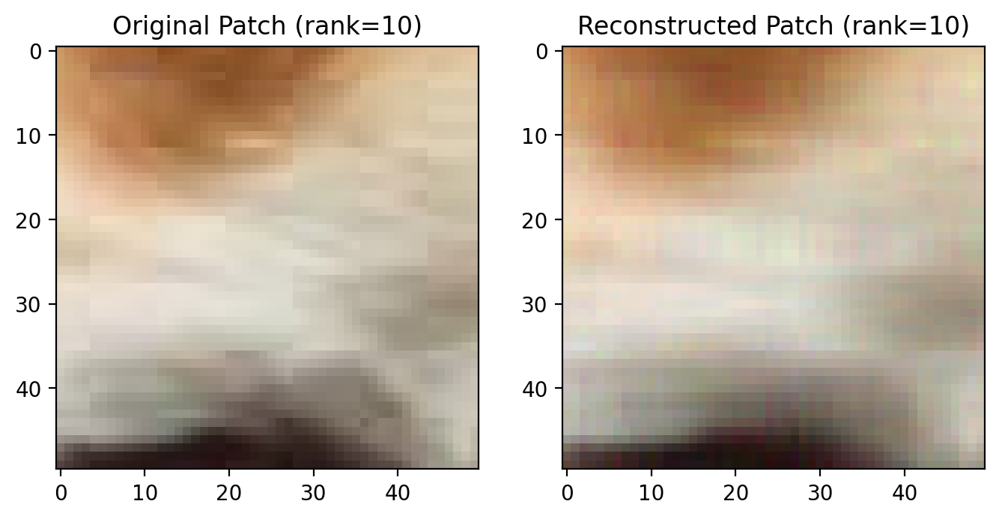

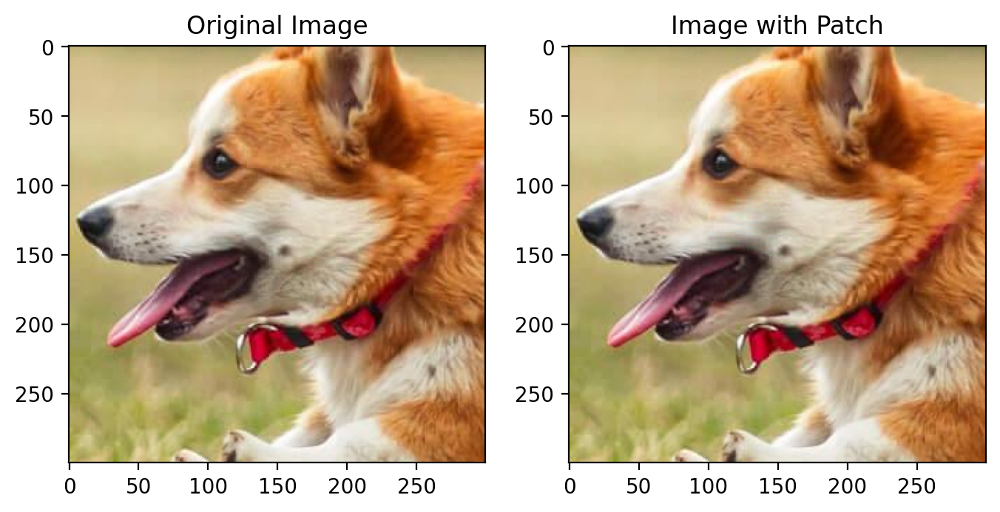



Rank: 25
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.001184
Epoch 2000/5000 - Loss: 0.000604
Epoch 3000/5000 - Loss: 0.000455
Epoch 4000/5000 - Loss: 0.000346
Epoch 5000/5000 - Loss: 0.000237
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.002785
Epoch 2000/5000 - Loss: 0.000765
Epoch 3000/5000 - Loss: 0.000533
Epoch 4000/5000 - Loss: 0.000433
Epoch 5000/5000 - Loss: 0.000335
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.002874
Epoch 2000/5000 - Loss: 0.001052
Epoch 3000/5000 - Loss: 0.000651
Epoch 4000/5000 - Loss: 0.000503
Epoch 5000/5000 - Loss: 0.000337

RMSE: 0.017403
PSNR: 35.187531


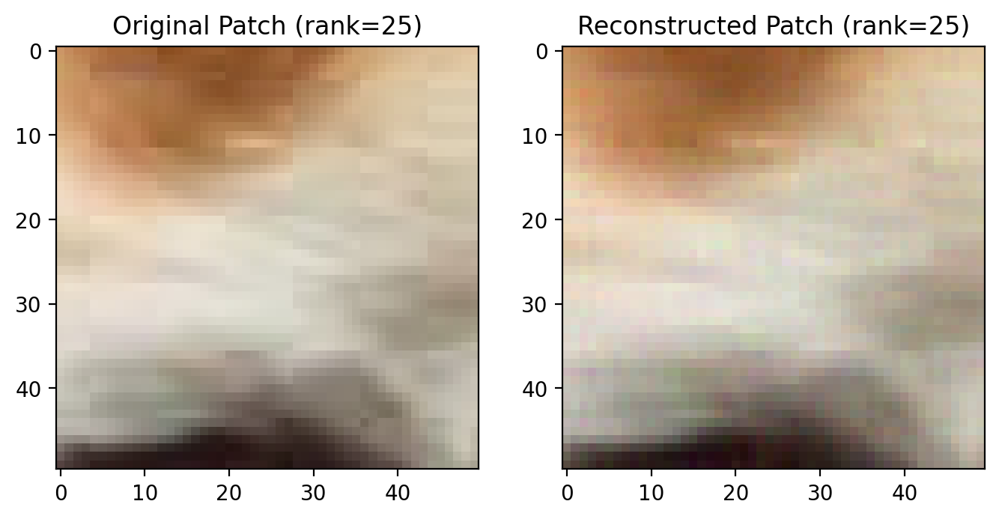

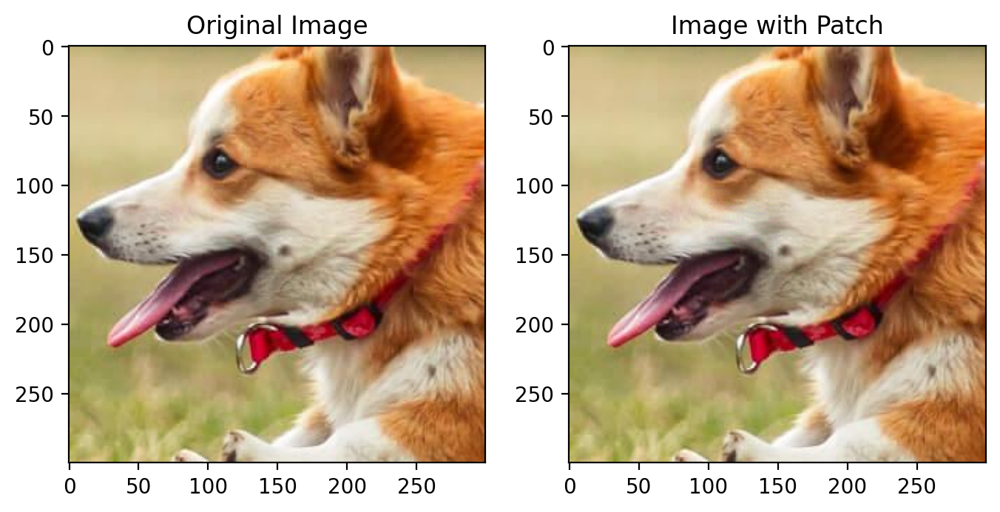



Rank: 50
Factorizing the R channel...
Epoch 1000/5000 - Loss: 0.000791
Epoch 2000/5000 - Loss: 0.000343
Epoch 3000/5000 - Loss: 0.000186
Epoch 4000/5000 - Loss: 0.000121
Epoch 5000/5000 - Loss: 0.000072
Factorizing the G channel...
Epoch 1000/5000 - Loss: 0.001208
Epoch 2000/5000 - Loss: 0.000220
Epoch 3000/5000 - Loss: 0.000144
Epoch 4000/5000 - Loss: 0.000114
Epoch 5000/5000 - Loss: 0.000092
Factorizing the B channel...
Epoch 1000/5000 - Loss: 0.000968
Epoch 2000/5000 - Loss: 0.000247
Epoch 3000/5000 - Loss: 0.000161
Epoch 4000/5000 - Loss: 0.000107
Epoch 5000/5000 - Loss: 0.000077

RMSE: 0.008954
PSNR: 40.960107


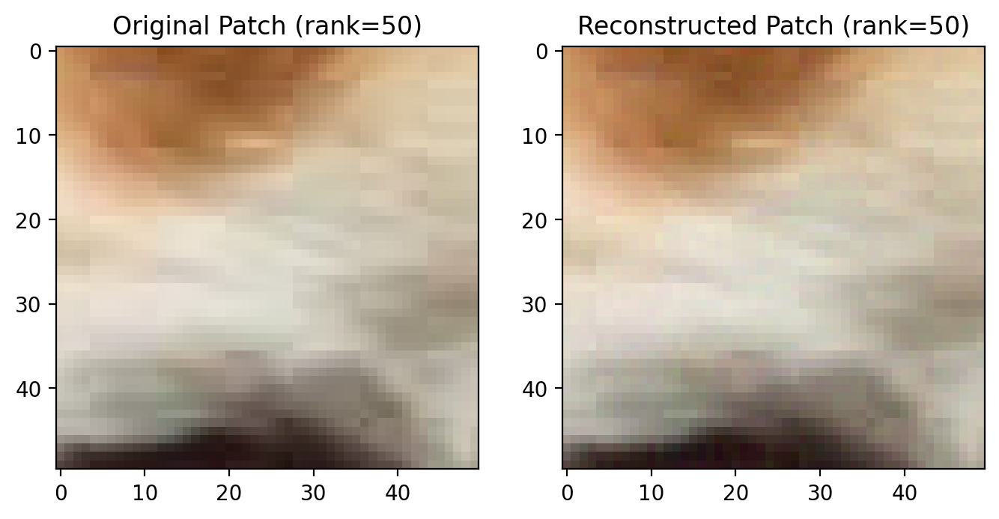

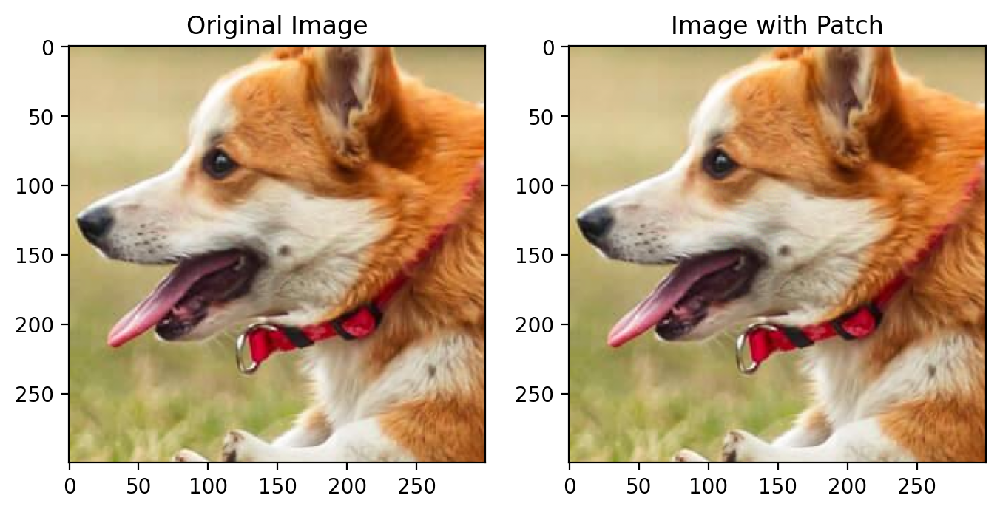

In [28]:
patch_size = 50
top_left_x = 100
top_left_y = 100

patch_3, bordered_img_3 = extract_patch(crop, patch_size, top_left_x, top_left_y)
print("*" * 100)
print("Patch 3:")
print(f"Top left coordinates: {top_left_x, top_left_y}")
print("Patch size:", patch_size)

rmse_values_3 = []
psnr_values_3 = []

for rank in ranks:
    print(f"\n\nRank: {rank}")
    compressed_patch_3, color_loss_3, rmse_3, psnr_3 = compress_compare_evaluate(patch_3, rank, device=device)
    rmse_values_3.append(rmse_3)
    psnr_values_3.append(psnr_3)
    img_with_patch_3 = add_patch_to_image(crop, compressed_patch_3, top_left_x, top_left_y)

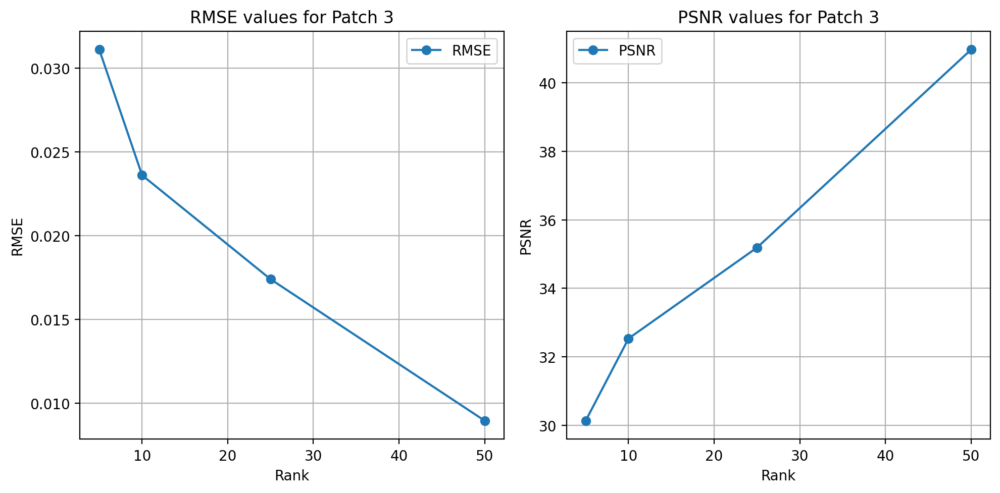

In [29]:
plot_rmse_psnr(ranks, rmse_values_3, psnr_values_3, patch_id=3)